In [1]:
!pip install pycocotools

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 12.6 MB/s eta 0:00:00


In [2]:
import cv2
import matplotlib.pyplot as plt
import json
import numpy as np
import pandas as pd
import copy
import logging
import colorsys
from random import randint, random
import shutil
from pathlib import Path
import os

from pycocotools import mask as cocomask

import tensorflow as tf
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow import keras
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Conv2D, UpSampling2D, Input, Add, Resizing, RandomFlip, RandomRotation, Rescaling

In [3]:
transformar_json2csv = True
extract_images = True

In [4]:
def rle_to_coco(annotation: dict) -> list[dict]:
    annotation["segmentation"] = json.loads(annotation["segmentation"].replace("'", "\""))
    annotation["segmentation"] = cocomask.frPyObjects(
        annotation["segmentation"],
        annotation["segmentation"]["size"][0],
        annotation["segmentation"]["size"][1],
    )

    maskedArr = cocomask.decode(annotation["segmentation"])
    contours, _ = cv2.findContours(maskedArr, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    segmentation = []

    for contour in contours:
        if contour.size >= 6:
            segmentation.append(contour)

    if len(segmentation) == 0:
        logging.debug(
            f"Annotation with id {annotation['id']} is not valid, it has no segmentations."
        )
        annotations = []

    else:
        annotations = list()
        for i, seg in enumerate(segmentation):

            single_annotation = copy.deepcopy(annotation)
            single_annotation["segmentation"] = [
                seg.astype(float).flatten().tolist()
            ]
            single_annotation["bbox"] = list(cv2.boundingRect(seg))
            single_annotation["area"] = cv2.contourArea(seg)
            #single_annotation["instance_id"] = annotation["id"]
            #single_annotation["annotation_id"] = f"{annotation['id']}_{i}"

            annotations.append(single_annotation)

    return annotations

# Trasformamos archivos JSON a CSV

In [5]:
def transform_rle_to_polygon(data):
    data_annot_rle = data[data.iscrowd == 1].copy()
    cantidad_registros = len(data_annot_rle)

    registros_transformados = pd.DataFrame(columns=["segmentation", "area", "iscrowd", "image_id", "bbox", "category_id", "id"])

    for i in range(cantidad_registros):
        registro = data_annot_rle.iloc[i].copy()
        list_objects = rle_to_coco(registro)
        for one_object in list_objects:
            registros_transformados = pd.concat([registros_transformados, one_object.to_frame().T], axis=0)
    
    index = data_annot_rle.index
    data_annot = pd.concat([data.drop(index, axis=0), registros_transformados], axis=0, ignore_index=True)
    return data_annot

In [6]:
if transformar_json2csv == True:
    for type_set in ["val", "train"]:
        with open("/kaggle/input/coco-2017-dataset/coco2017/annotations/instances_"+type_set+"2017.json") as f:
            instances = json.load(f)
            pd.json_normalize(instances, record_path="images", max_level=0).to_csv("/kaggle/working/"+type_set+"_images.csv", index=False)
            pd.json_normalize(instances, record_path="annotations", max_level=0).to_csv("/kaggle/working/"+type_set+"_annotations.csv", index=False)
            pd.json_normalize(instances, record_path="categories", max_level=0).to_csv("/kaggle/working/"+type_set+"_categories.csv", index=False)
            
    val_dir_images = pd.read_csv("/kaggle/working/val_images.csv")
    val_annot = pd.read_csv("/kaggle/working/val_annotations.csv")
    val_cat = pd.read_csv("/kaggle/working/val_categories.csv")
    
    train_dir_images = pd.read_csv("/kaggle/working/train_images.csv")
    train_annot = pd.read_csv("/kaggle/working/train_annotations.csv")
    train_cat = pd.read_csv("/kaggle/working/train_categories.csv")
    
    train_annot = transform_rle_to_polygon(train_annot)
    val_annot = transform_rle_to_polygon(val_annot)
    
    train_annot.to_csv("/kaggle/working/train_annotations.csv", index=False)
    val_annot.to_csv("/kaggle/working/val_annotations.csv", index=False)
    
else:
    val_dir_images = pd.read_csv("/kaggle/working/val_images.csv")
    val_annot = pd.read_csv("/kaggle/working/val_annotations.csv")
    val_cat = pd.read_csv("/kaggle/working/val_categories.csv")
    
    train_dir_images = pd.read_csv("/kaggle/working/train_images.csv")
    train_annot = pd.read_csv("/kaggle/working/train_annotations.csv")
    train_cat = pd.read_csv("/kaggle/working/train_categories.csv")

In [7]:
train_dir_images.head()

,license,file_name,coco_url,height,width,date_captured,flickr_url,id
0,3,000000391895.jpg,http://images.cocodataset.org/train2017/000000...,360,640,2013-11-14 11:18:45,http://farm9.staticflickr.com/8186/8119368305_...,391895
1,4,000000522418.jpg,http://images.cocodataset.org/train2017/000000...,480,640,2013-11-14 11:38:44,http://farm1.staticflickr.com/1/127244861_ab0c...,522418
2,3,000000184613.jpg,http://images.cocodataset.org/train2017/000000...,336,500,2013-11-14 12:36:29,http://farm3.staticflickr.com/2169/2118578392_...,184613
3,3,000000318219.jpg,http://images.cocodataset.org/train2017/000000...,640,556,2013-11-14 13:02:53,http://farm5.staticflickr.com/4125/5094763076_...,318219
4,3,000000554625.jpg,http://images.cocodataset.org/train2017/000000...,640,426,2013-11-14 16:03:19,http://farm5.staticflickr.com/4086/5094162993_...,554625


In [8]:
train_annot.head()

,segmentation,area,iscrowd,image_id,bbox,category_id,id
0,"[[239.97, 260.24, 222.04, 270.49, 199.84, 253....",2765.14865,0,558840,"[199.84, 200.46, 77.71, 70.88]",58,156
1,"[[247.71, 354.7, 253.49, 346.99, 276.63, 337.3...",1545.4213,0,200365,"[234.22, 317.11, 149.39, 38.55]",58,509
2,"[[274.58, 405.68, 298.32, 405.68, 302.45, 402....",5607.66135,0,200365,"[239.48, 347.87, 160.0, 57.81]",58,603
3,"[[296.65, 388.33, 296.65, 388.33, 297.68, 388....",0.0,0,200365,"[296.65, 388.33, 1.03, 0.0]",58,918
4,"[[251.87, 356.13, 260.13, 343.74, 300.39, 335....",800.41325,0,200365,"[251.87, 333.42, 125.94, 22.71]",58,1072


In [9]:
train_cat.head()

,supercategory,id,name
0,person,1,person
1,vehicle,2,bicycle
2,vehicle,3,car
3,vehicle,4,motorcycle
4,vehicle,5,airplane


# Mergeando set de datos

In [10]:
train = pd.merge(train_dir_images, train_annot, how="inner", left_on='id', right_on='image_id')
train = pd.merge(train, train_cat, how="inner", left_on='category_id', right_on='id')
train.drop(["id_x", "id"], axis=1, inplace=True)
train.rename(columns={
    "id_y": "object_id",
    "name": "category_name"
}, inplace=True)
train[["image_id", "category_id"]] = train[["image_id", "category_id"]].astype(int)
train.head()

,license,file_name,coco_url,height,width,date_captured,flickr_url,segmentation,area,iscrowd,image_id,bbox,category_id,object_id,supercategory,category_name
0,3,000000391895.jpg,http://images.cocodataset.org/train2017/000000...,360,640,2013-11-14 11:18:45,http://farm9.staticflickr.com/8186/8119368305_...,"[[376.97, 176.91, 398.81, 176.91, 396.38, 147....",12190.44565,0,391895,"[359.17, 146.17, 112.45, 213.57]",4,151091,vehicle,motorcycle
1,6,000000321107.jpg,http://images.cocodataset.org/train2017/000000...,480,269,2013-11-15 03:14:32,http://farm4.staticflickr.com/3038/4555159978_...,"[[154.31, 133.65, 136.67, 144.1, 132.1, 123.85...",1080.08415,0,321107,"[132.1, 90.53, 43.77, 65.99]",4,148023,vehicle,motorcycle
2,5,000000232262.jpg,http://images.cocodataset.org/train2017/000000...,427,640,2013-11-15 05:23:22,http://farm9.staticflickr.com/8048/8089005305_...,"[[47.22, 231.67, 47.39, 240.26, 51.17, 239.57,...",434.034,0,232262,"[28.49, 224.45, 25.6, 32.82]",4,150811,vehicle,motorcycle
3,3,000000061181.jpg,http://images.cocodataset.org/train2017/000000...,321,500,2013-11-15 05:26:41,http://farm4.staticflickr.com/3085/2658286283_...,"[[396.61, 179.11, 392.63, 179.02, 391.72, 181....",86.9453,0,61181,"[389.31, 179.02, 9.13, 14.36]",4,152438,vehicle,motorcycle
4,4,000000097434.jpg,http://images.cocodataset.org/train2017/000000...,266,640,2013-11-15 12:18:56,http://farm8.staticflickr.com/7122/7856942124_...,"[[368.66, 210.92, 371.88, 176.11, 369.31, 172....",26226.27955,0,97434,"[368.02, 57.52, 259.09, 169.51]",4,154219,vehicle,motorcycle


In [11]:
val = pd.merge(val_dir_images, val_annot, how="inner", left_on='id', right_on='image_id')
val = pd.merge(val, val_cat, how="inner", left_on='category_id', right_on='id')
val.drop(["id_x", "id"], axis=1, inplace=True)
val.rename(columns={
    "id_y": "object_id",
    "name": "category_name"
}, inplace=True)
val[["image_id", "category_id"]] = val[["image_id", "category_id"]].astype(int)
val.head()

,license,file_name,coco_url,height,width,date_captured,flickr_url,segmentation,area,iscrowd,image_id,bbox,category_id,object_id,supercategory,category_name
0,4,000000397133.jpg,http://images.cocodataset.org/val2017/00000039...,427,640,2013-11-14 17:02:52,http://farm7.staticflickr.com/6116/6255196340_...,"[[224.24, 297.18, 228.29, 297.18, 234.91, 298....",1481.38065,0,397133,"[217.62, 240.54, 38.99, 57.75]",44,82445,kitchen,bottle
1,3,000000355257.jpg,http://images.cocodataset.org/val2017/00000035...,427,640,2013-11-20 23:51:16,http://farm3.staticflickr.com/2869/8759177830_...,"[[267.63, 91.78, 257.63, 88.59, 257.63, 80.59,...",1864.97305,0,355257,"[250.44, 11.04, 26.78, 81.94]",44,92491,kitchen,bottle
2,1,000000206027.jpg,http://images.cocodataset.org/val2017/00000020...,480,640,2013-11-21 05:13:42,http://farm5.staticflickr.com/4105/4998256912_...,"[[251.89, 2.7, 250.81, 201.62, 288.65, 213.51,...",18930.06515,0,206027,"[250.81, 0.54, 98.38, 212.97]",44,85771,kitchen,bottle
3,1,000000206027.jpg,http://images.cocodataset.org/val2017/00000020...,480,640,2013-11-21 05:13:42,http://farm5.staticflickr.com/4105/4998256912_...,"[[400.52, 1.29, 390.19, 21.94, 380.9, 107.61, ...",18649.97725,0,206027,"[363.35, 1.29, 105.3, 238.45]",44,91380,kitchen,bottle
4,1,000000206027.jpg,http://images.cocodataset.org/val2017/00000020...,480,640,2013-11-21 05:13:42,http://farm5.staticflickr.com/4105/4998256912_...,"[[84.46, 2.68, 96.82, 164.39, 98.88, 264.31, 2...",24891.7937,0,206027,"[2.06, 1.65, 96.82, 280.17]",44,91574,kitchen,bottle


# Visualizando algunas imagenes

## Set de entrenamiento

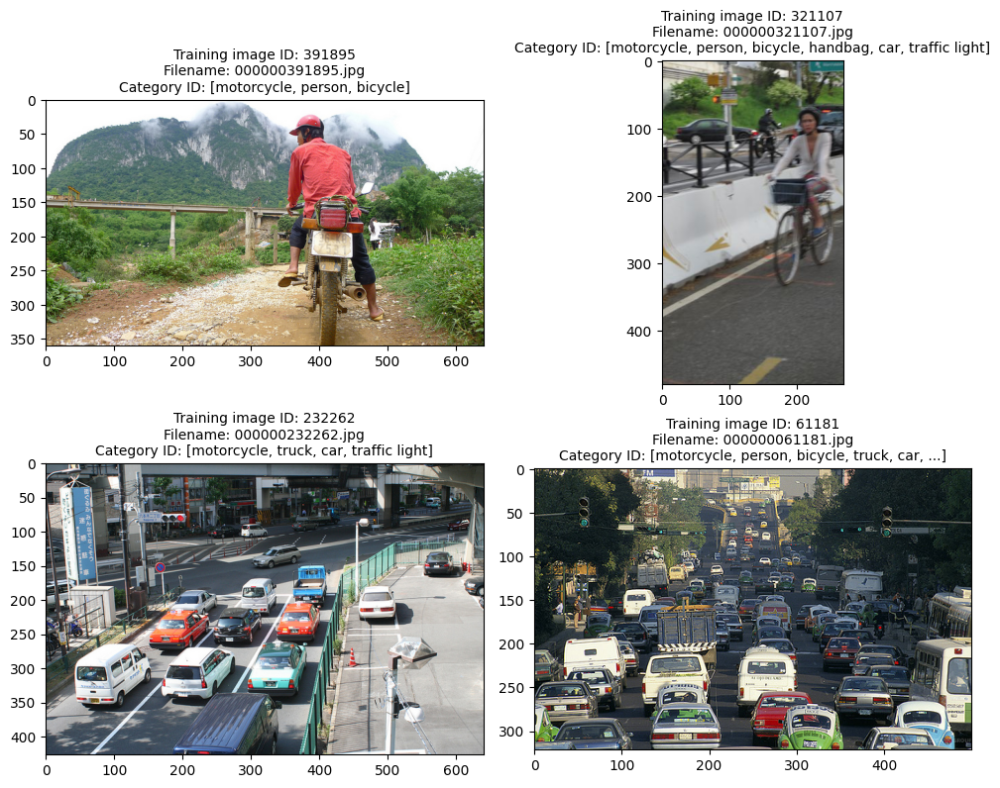

In [12]:
def show_images(data, type_set="train", index=0):
    filenames = data["file_name"].unique()[0+index*4:4+index*4]
    image_id = data["image_id"].unique()[0+index*4:4+index*4]

    fig, axs = plt.subplots(2, 2, figsize=(10, 8))
    for i, filename in enumerate(filenames):
        category_id = data.loc[data["image_id"] == image_id[i], "category_name"].unique().tolist()
        
        img = cv2.imread("/kaggle/input/coco-2017-dataset/coco2017/"+type_set+"2017/"+filename)
        
        plt.subplot(2, 2, i+1)
        plt.imshow(img[...,::-1]); # BGR -> RGB
        plt.title(f"Training image ID: {image_id[i]}\nFilename: {filename}\nCategory ID: {category_id if len(category_id) <= 6 else category_id[0:5]+['...']}".replace("'", ""), fontsize=10)
    plt.tight_layout()
    return

show_images(train, index=0)

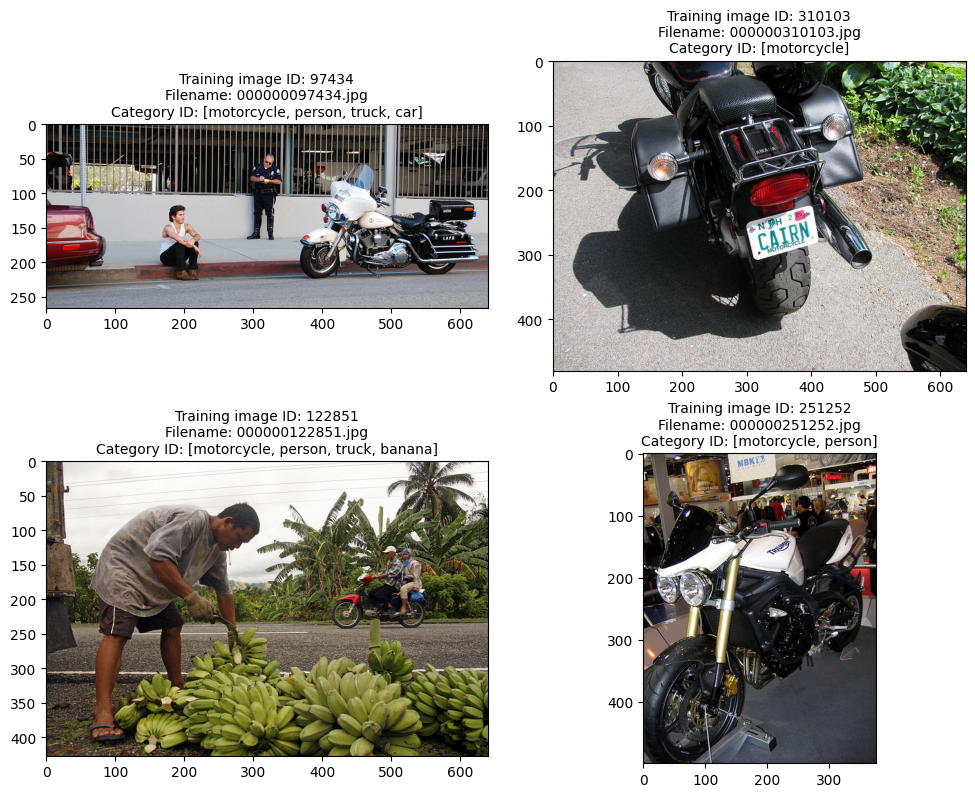

In [13]:
show_images(train, index=1)

## Set de validación

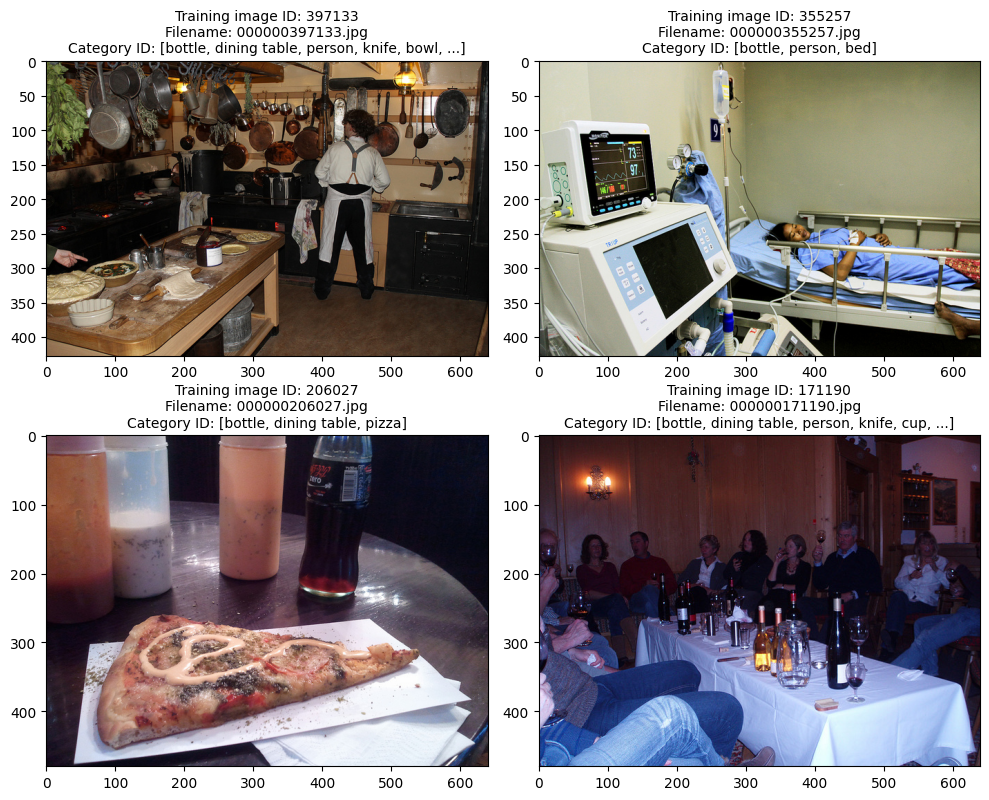

In [14]:
show_images(val, type_set="val", index=0)

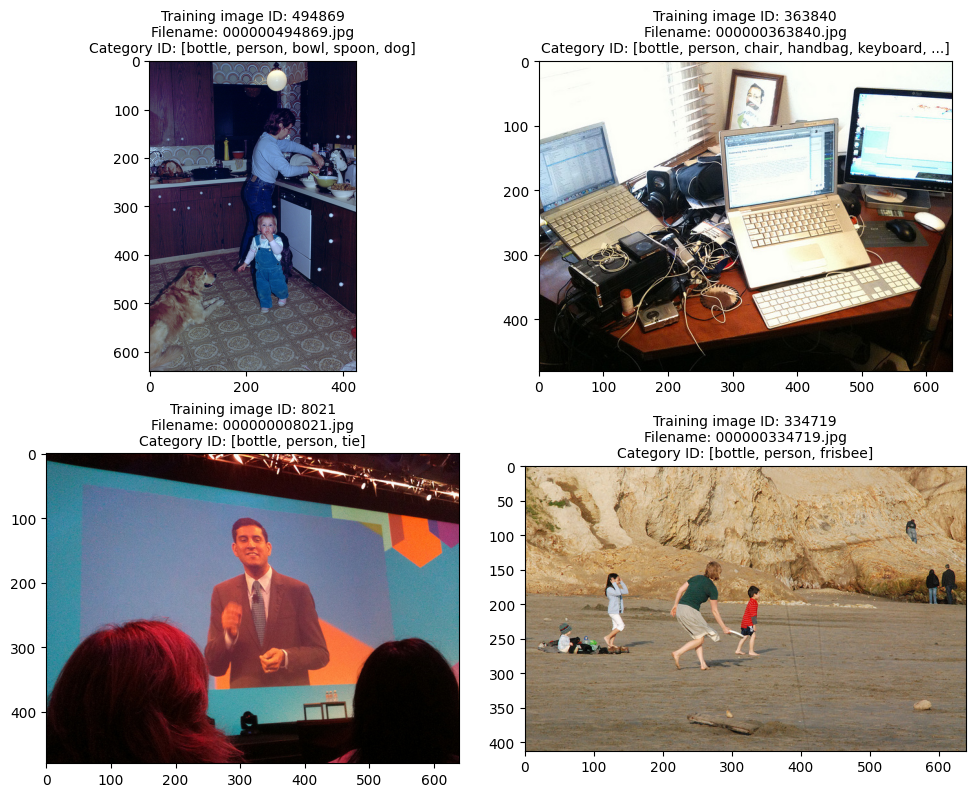

In [15]:
show_images(val, type_set="val", index=1)

## Objetivos

In [16]:
def get_data_target(df, targets, dataset="train"):
    df_target = df[df.category_name.isin(targets)].copy()
    df_target['segmentation'] = df_target['segmentation'].apply(lambda x: np.fromstring(str(x).replace('[', '').replace(']','').replace('\n', ''), dtype=float, sep=',').reshape(-1,1,2))
    df_target['bbox'] = df_target['bbox'].apply(lambda x: np.fromstring(str(x).replace('[', '').replace(']','').replace('\n', ''), dtype=float, sep=','))
    
    df_target = df_target.groupby(["file_name"]).agg({"bbox": lambda x: list(x), "segmentation": lambda x: x, "category_id": lambda x: list(x), "category_name": lambda x: list(x)}).reset_index().copy()
    
    df_target['bbox'] = df_target['bbox'].apply(lambda x: np.array(x))
    df_target['category_id'] = df_target['category_id'].apply(lambda x: np.array(x))
    df_target['segmentation'] = df_target['segmentation'].apply(lambda x: np.array(x))
    
    return df_target

targets = ['banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake']

train_target = get_data_target(train, targets)
val_target = get_data_target(val, targets, dataset="val")

train_target.head()

,file_name,bbox,segmentation,category_id,category_name
0,000000000009.jpg,"[[376.2, 40.36, 75.55, 46.53], [465.78, 38.97,...","[[[[376.2 61.55]], [[391.86 46.35]], [[424....","[55, 55, 55, 55, 56]","[orange, orange, orange, orange, broccoli]"
1,000000000092.jpg,"[[125.7, 0.96, 376.14, 292.66]]","[[[483.61, 153.53]], [[409.73, 208.22]], [[355...",[61],[cake]
2,000000000110.jpg,"[[136.66, 391.91, 337.69, 82.44]]","[[[136.66, 473.22]], [[167.15, 429.18]], [[227...",[59],[pizza]
3,000000000113.jpg,"[[142.38, 424.27, 260.32, 149.57]]","[[[176.9, 506.25]], [[152.45, 481.8]], [[142.3...",[61],[cake]
4,000000000127.jpg,"[[179.15, 263.57, 125.95, 141.15]]","[[[272.53, 402.55]], [[266.02, 384.09]], [[292...",[61],[cake]


In [17]:
if extract_images == True:
    for typeSet, filenames in [("val", val_target.file_name.unique()), ("train", train_target.file_name.unique())]:
        Path("/kaggle/working/"+typeSet+"2017/").mkdir(parents=True, exist_ok=True)
        input_folder = "/kaggle/input/coco-2017-dataset/coco2017/"+typeSet+"2017/"
        output_folder = "/kaggle/working/"+typeSet+"2017/"
        for filename in filenames:
            shutil.copy(input_folder+filename, output_folder+filename)
#shutil.rmtree(output_folder)

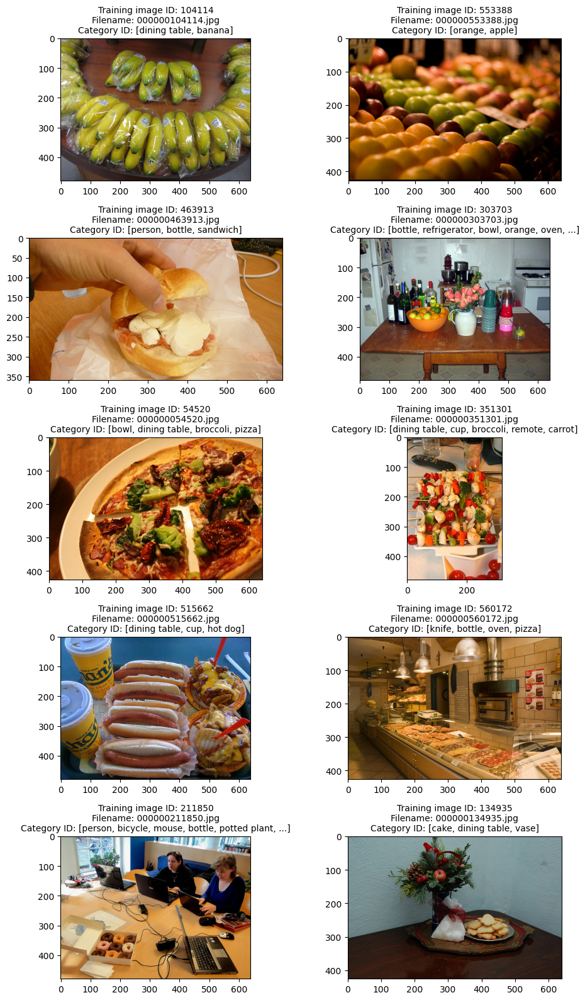

In [18]:
def show_targets(data, type_set="train", targets=[]):
    fig, axs = plt.subplots(5, 2, figsize=(10, 16))
    
    for i, target in enumerate(targets):
        target_images = data[data.category_name == target].copy()
        value = randint(0, len(target_images)-1)
        target_image = target_images.iloc[value]
        category_id = data.loc[data["image_id"] == target_image.image_id, "category_name"].unique().tolist()
        
        img = cv2.imread("/kaggle/input/coco-2017-dataset/coco2017/"+type_set+"2017/"+target_image.file_name)
        
        plt.subplot(5, 2, i+1)
        plt.imshow(img[...,::-1]); # BGR -> RGB
        plt.title(f"Training image ID: {target_image.image_id}\nFilename: {target_image.file_name}\nCategory ID: {category_id if len(category_id) <= 6 else category_id[0:5]+['...']}".replace("'", ""), fontsize=10)
    plt.tight_layout()
    return

show_targets(train, targets=targets)

## Bounding boxes

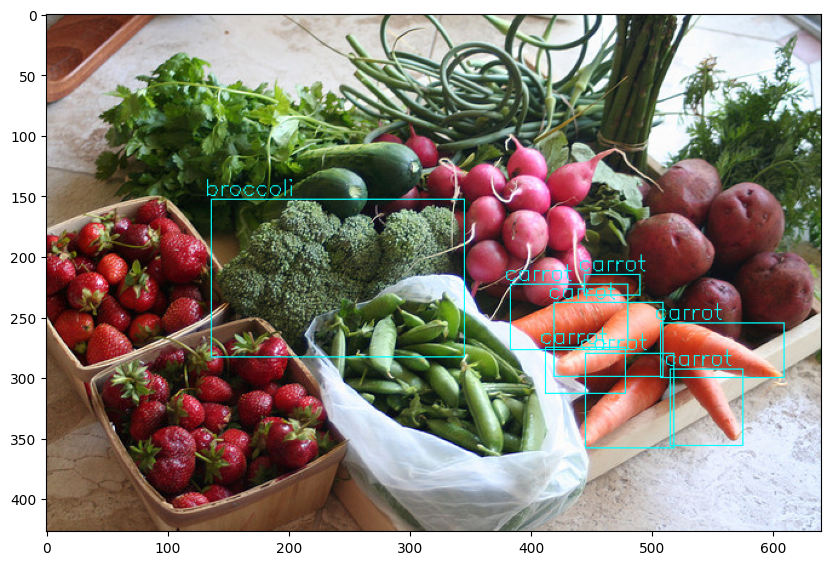

In [19]:
def add_bbox(img, bbox, category_name, fontScale=0.6):
    bbox = bbox.astype(int)
    img = cv2.rectangle(img, (bbox[0], bbox[1]), (bbox[0]+bbox[2], bbox[1]+bbox[3]), (255, 255, 0), 1)
    img = cv2.putText(img, category_name, (bbox[0]-5, bbox[1]-3), 0, fontScale, (255, 255, 0), 1)
    return tf.convert_to_tensor(img)

def show_bbox(file, img=None, dataset="train"):
    if img is None:
        img = cv2.imread("/kaggle/input/coco-2017-dataset/coco2017/"+dataset+"2017/"+file.file_name)
    
    plt.figure(figsize=(10, 10))
    for bbox, category_name in zip(file.bbox, file.category_name):
        add_bbox(img, bbox, category_name)
    return img

file = train_target.iloc[1090]
img = show_bbox(file)
plt.imshow(img[...,::-1]); # BGR -> RGB

## Segmentations

<Figure size 1000x1000 with 0 Axes>

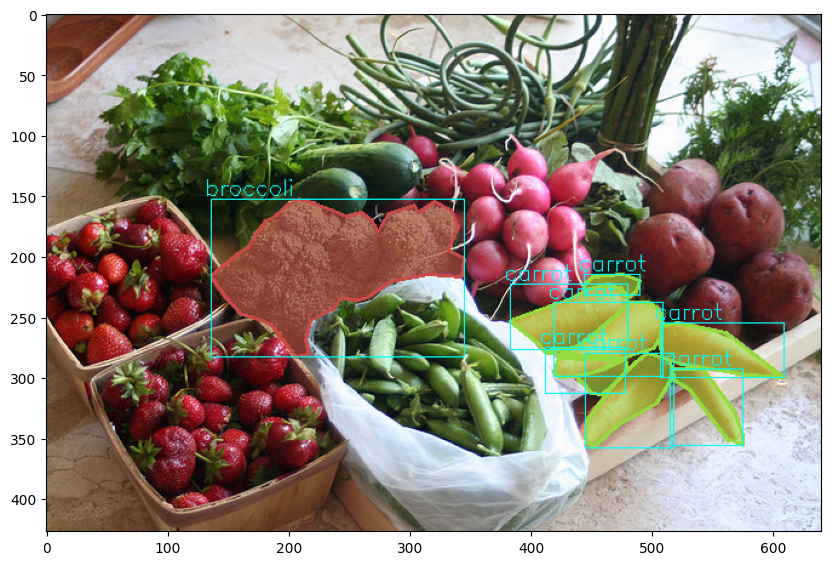

In [20]:
def get_random_color():
    h,s,l = random(), 0.5 + random()/2.0, 0.4 + random()/5.0
    return [int(256*i) for i in colorsys.hls_to_rgb(h,l,s)]

def draw_mask(file, alpha, dataset="train"):
    categories_name = list(set(file.category_name))
    colorXcategory = pd.DataFrame(data={"color":[get_random_color() for _ in range(len(categories_name))]}, index=categories_name)
    img = cv2.imread("/kaggle/input/coco-2017-dataset/coco2017/"+dataset+"2017/"+file.file_name)
    masked_image = img.copy()
    
    plt.figure(figsize=(10, 10))
    for category_name, segmentation in zip(file.category_name, file.segmentation):
        color = colorXcategory.loc[category_name, "color"]
        points = segmentation.astype(int)
        cv2.fillPoly(masked_image, [points], color=color)
        
    img = cv2.addWeighted(masked_image, alpha, img, 1 - alpha, 0) 
    
    for category_name, segmentation in zip(file.category_name, file.segmentation):
        color = colorXcategory.loc[category_name, "color"]
        points = segmentation.astype(int)
        img = cv2.polylines(img, [points], True, color=color, thickness=2)
    return img

file = train_target.iloc[1090]
img = draw_mask(file, 0.6)
img = show_bbox(file, img)
plt.imshow(img[...,::-1]); #BGR -> RGB

# Creacion de datasets de imagenes

In [21]:
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)

In [22]:
image_shape = (224, 224, 3)
num_classes = 10

In [23]:
def multianchor_boxes(data, sizes=None, ratios=None):
    in_h, in_w = data.shape[0:2]
    n_sizes, n_ratios = len(sizes), len(ratios)
    boxes_per_pixel = (n_sizes + n_ratios - 1)
    size_t = tf.convert_to_tensor(sizes)
    ratio_t = tf.convert_to_tensor(ratios)
    
    offset_h, offset_w = tf.constant([0.5], dtype="float32"), tf.constant([0.5], dtype="float32")
    steps_h = 1.0 / in_h
    steps_w = 1.0 / in_w

    center_h = (tf.range(in_h, dtype="float32") + offset_h) * steps_h
    center_w = (tf.range(in_w, dtype="float32") + offset_w) * steps_w
    shift_y, shift_x = tf.meshgrid(center_h, center_w, indexing='ij')
    shift_y, shift_x = tf.reshape(shift_y, -1), tf.reshape(shift_x, -1)

    w = tf.concat([size_t * tf.math.sqrt(ratio_t[0]),
                   sizes[0] * tf.math.sqrt(ratio_t[1:])], 0)\
                   * in_h / in_w
    h = tf.concat([size_t / tf.math.sqrt(ratio_t[0]),
                   sizes[0] / tf.math.sqrt(ratio_t[1:])], 0)
    
    anchor_manipulations = tf.tile(tf.transpose(tf.stack([-w, -h, w, h])), tf.constant([in_h*in_w, 1])) / 2

    out_grid = tf.repeat(tf.stack([shift_x, shift_y, shift_x, shift_y],
                axis=1), boxes_per_pixel, axis=0)
    output = out_grid + anchor_manipulations
    return tf.expand_dims(output, 0)

def image_to_tensor(path):
    return tf.convert_to_tensor(cv2.imread(path)/255)

img_t = image_to_tensor("/kaggle/working/train2017/000000580026.jpg")

Y = multianchor_boxes(img_t, sizes=[0.5, 0.25, 0.15], ratios=[1, 2, 0.5])
h, w = img_t.shape[0:2]
boxes = tf.reshape(Y, [h, w, 5, 4])
bbox_scale = tf.constant([w, h, w, h], dtype="float32")
boxes[0, 250, :, :] * bbox_scale

<tf.Tensor: shape=(5, 4), dtype=float32, numpy=
array([[ 141.25002 , -108.75    ,  359.75003 ,  109.75    ],
       [ 195.87502 ,  -54.125   ,  305.125   ,   55.125004],
       [ 217.725   ,  -32.275   ,  283.27502 ,   33.275   ],
       [  95.99719 ,  -76.75141 ,  405.0028  ,   77.75142 ],
       [ 173.2486  , -154.00282 ,  327.75143 ,  155.00284 ]],
      dtype=float32)>

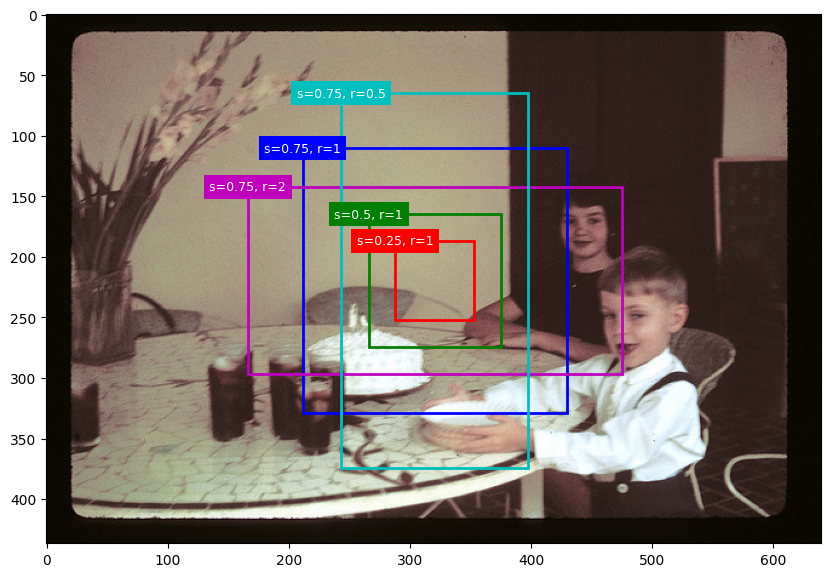

In [24]:
def make_list(obj, default_values=None):
        if obj is None:
            obj = default_values
        elif not isinstance(obj, (list, tuple)):
            obj = [obj]
        return obj

def bbox_to_rectangle(bbox, color):
    return plt.Rectangle(xy=(bbox[0], bbox[1]),
                         width=bbox[2]-bbox[0],
                         height=bbox[3]-bbox[1],
                         fill=False, 
                         edgecolor=color, 
                         linewidth=2)

def show_bboxes(axes, bboxes, labels=None, colors=None):
    labels = make_list(labels)
    colors = make_list(colors, ['b', 'g', 'r', 'm', 'c'])
    for i, bbox in enumerate(bboxes):
        color = colors[i % len(colors)]
        rect = bbox_to_rectangle(bbox, color)
        axes.add_patch(rect)
        if labels and len(labels) > i:
            text_color = 'k' if color == 'w' else 'w'
            axes.text(rect.xy[0], rect.xy[1], labels[i],
                      va='center', ha='center', fontsize=9, color=text_color,
                      bbox=dict(facecolor=color, lw=0))
    return

plt.figure(figsize=(10, 10))
fig = plt.imshow(img_t[...,::-1])
show_bboxes(fig.axes, boxes[219, 320, :, :] * bbox_scale,
            ['s=0.75, r=1', 's=0.5, r=1', 's=0.25, r=1', 's=0.75, r=2',
             's=0.75, r=0.5']);

# Redimensionando imagenes manteniendo la relación de aspecto

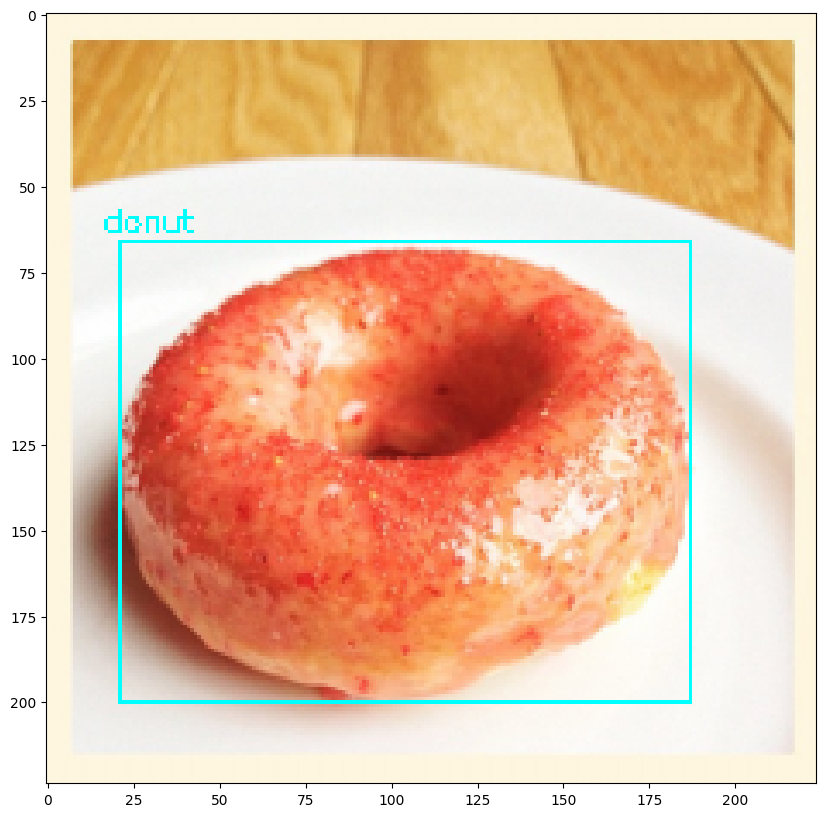

In [25]:
def padding_zero(image, bbox):
    big_side = max(image.shape[0:2])
    small_axis = np.argmin(image.shape[0:2])
    
    background = np.zeros((big_side, big_side, 3), np.float32)
    ax, ay = (big_side - image.shape[1])//2,(big_side - image.shape[0])//2
    background[ay:image.shape[0]+ay, ax:ax+image.shape[1]] = image
    bbox[:, 0 if small_axis else 1] += (ay, ax)[small_axis]
    
    return background, bbox

def resize(image, bbox, dim):
    image_ = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)
    y_ = image.shape[0]
    x_ = image.shape[1]
    
    x_scale = dim[1] / x_
    y_scale = dim[0] / y_
    
    bbox[:, 0] *= x_scale
    bbox[:, 1] *= y_scale
    bbox[:, 2] *= x_scale
    bbox[:, 3] *= y_scale
    
    return image_, bbox

def preprocess_data(image_data, bboxs):
    image_data, bboxs = padding_zero(image_data, bboxs)
    image_data, bboxs = resize(image_data, bboxs, (224, 224))
    return tf.convert_to_tensor(image_data, dtype="float32"), bboxs

file = train_target.sample(1).iloc[0]
img_t = image_to_tensor("/kaggle/working/train2017/"+file.file_name)
img_t, bboxs = preprocess_data(img_t, file.bbox.copy())

for bbox, category_name in zip(bboxs, file.category_name):
    img_t = add_bbox(img_t.numpy(), bbox, category_name, fontScale=0.3)

plt.figure(figsize=(10, 10))
plt.imshow(img_t[...,::-1]);

# Intersection over Union (IoU)

<img src="https://drive.google.com/uc?export=view&id=1FFF96u89hEnlXSofYZk0rtd6JopligH9" width=400>

In [26]:
def iou(boxesA, boxesB):
    left_upper = tf.maximum(boxesA[:, None, :2], boxesB[:, :2])
    right_down = tf.minimum(boxesA[:, None, 2:], boxesB[:, 2:])
    intersection = tf.maximum(0.0, right_down - left_upper)
    intersection_area = intersection[:, :, 0] * intersection[:, :, 1]
    boxes1_area = (boxesA[:, 2] - boxesA[:, 0]) * (boxesA[:, 3] - boxesA[:, 1])
    boxes2_area = (boxesB[:, 2] - boxesB[:, 0]) * (boxesB[:, 3] - boxesB[:, 1])
    union_area = tf.maximum(
        boxes1_area[:, None] + boxes2_area - intersection_area, 1e-8
    )
    return tf.clip_by_value(intersection_area / union_area, 0.0, 1.0)

iou(boxes[219, 320, :, :], boxes[219, 320, :, :])

<tf.Tensor: shape=(5, 5), dtype=float32, numpy=
array([[1.        , 0.25000003, 0.09      , 0.5469182 , 0.54691815],
       [0.25000003, 1.        , 0.35999992, 0.25000003, 0.2500001 ],
       [0.09      , 0.35999992, 1.        , 0.08999999, 0.09000001],
       [0.5469182 , 0.25000003, 0.08999999, 1.        , 0.33333334],
       [0.54691815, 0.2500001 , 0.09000001, 0.33333334, 1.        ]],
      dtype=float32)>

# Feature Pyramid Network (FPN)
FPN es una red donde el flujo de datos consta de un camino ascendente, reduciendo la resolucion espacial, y un camino descendente, extracción de características a través de una red convolucional habitual.

<img src="https://drive.google.com/uc?export=view&id=1CZL-XjF1getJ0Qw0fJk9ZCDH7DXfvbXX" width=400>

Un Single-Shot Detector (SSD) realiza la detección a partir de múltiples mapas de características de las capas superiores (pequeñas resoluciones), esto debido a que si se realizaran las detecciones en las capas inferiores (grandes resoluciones) se requerira de tiempos y velocidads computacionales importantes, por lo que al realizar las detecciones sobre resoluciones menores la deteccion de objetos pequeños empeora.

Por otro lado, las FPN a traves de este camino ascendente-descendente permite construir capas de mayor resolución a partir de una capa rica en semántica.

<img src="https://drive.google.com/uc?export=view&id=1B2FtsnZhflu93yv8USxLmsjGP89BRZLf" width=400>

Si bien las capas reconstruidas son semánticamente fuertes, las ubicaciones de los objetos no son precisas después de todo el muestreo. Agregamos conexiones laterales entre las capas reconstruidas y los mapas de características correspondientes para ayudar al detector a predecir mejor la ubicación.

<img src="https://drive.google.com/uc?export=view&id=1sxpFd9zhujY0IxEp6DoN7wyIB6_4fXT9" width=400>

El camino ascendente esta compuesta por el backbone ResNet50, el cual contiene 5 modulos convolucionales donde cada modulo nos permite reducir la dimension espacial a la mitad (se duplican los strides).

Como podemos ver, para obtener M5 debemos aplicar un filtro convolucional con un kernel size de 1x1 a C5, aumentando la muestra de M5 por 2 usando el muestreo nearest neighbors ascendente, aplicando un filtro convolucional con kernel size de 1x1 a M4 y sumando estos resultados obtenemos M4. Aplicamos una convolución de 3x3 a todas las capas fusionadas. Este filtro reduce el efecto de alias cuando se fusiona con la capa muestreada. De esta forma podemos obtener los niveles de escala P5, P4, P3 y P2. Tengamos en cuenta que a medida que descendemos el procesamiento computacional comienza a tornarse costoso debido a que la dimension espacial vuelve a incrementarse, por esta razon a menudo nos podemos detener en P2, P3 o antes.

In [27]:
from tensorflow.keras.applications.resnet import ResNet50

input_layer = Input((None, None, 3))
rescaling_layer = Rescaling(scale=1./255)(input_layer)
#resizing_layer = Resizing(224, 224)(rescaling_layer)
#flip_layer = RandomFlip()(resizing_layer)
#rotation_layer = RandomRotation(0.25)(flip_layer)

backbone = ResNet50(include_top=False, input_tensor=rescaling_layer, input_shape=(224, 224, 3))
backbone.trainable = False

for layer in backbone.layers:
    if "out" in layer.name:
        print(layer.name)

94765736/94765736 [==============================] - 1s 0us/step
conv2_block1_out
conv2_block2_out
conv2_block3_out
conv3_block1_out
conv3_block2_out
conv3_block3_out
conv3_block4_out
conv4_block1_out
conv4_block2_out
conv4_block3_out
conv4_block4_out
conv4_block5_out
conv4_block6_out
conv5_block1_out
conv5_block2_out
conv5_block3_out


In [28]:
#Camino ascendente
c2_output, c3_output, c4_output, c5_output = [
    backbone.get_layer(layer_name).output for layer_name in ["conv2_block3_out", "conv3_block4_out", "conv4_block6_out", "conv5_block3_out"]
]

#backbone = keras.Model(inputs=[backbone.inputs], outputs=[c2_output, c3_output, c4_output, c5_output])

<img src="https://drive.google.com/uc?export=view&id=1sxpFd9zhujY0IxEp6DoN7wyIB6_4fXT9" width=400>

In [29]:
#Camino descendente
upsample_2x = UpSampling2D(2)

conv_c5_1x1 = Conv2D(256, 1, 1, "same")
p5_output = conv_c5_1x1(c5_output)

conv_c4_1x1 = Conv2D(256, 1, 1, "same")
p4_output = Add()([conv_c4_1x1(c4_output), upsample_2x(p5_output)])

conv_c3_1x1 = Conv2D(256, 1, 1, "same")
p3_output = Add()([conv_c3_1x1(c3_output), upsample_2x(p4_output)])

conv_c2_1x1 = Conv2D(256, 1, 1, "same")
p2_output = Add()([conv_c2_1x1(c2_output), upsample_2x(p3_output)])

#Scale levels P
conv_c2_3x3 = Conv2D(256, 3, 1, "same")
conv_c3_3x3 = Conv2D(256, 3, 1, "same")
conv_c4_3x3 = Conv2D(256, 3, 1, "same")
conv_c5_3x3 = Conv2D(256, 3, 1, "same")

p2_output = conv_c2_3x3(p2_output)
p3_output = conv_c3_3x3(p3_output)
p4_output = conv_c4_3x3(p4_output)

#conv_c6_3x3 = keras.layers.Conv2D(256, 3, 2, "same")
#conv_c7_3x3 = keras.layers.Conv2D(256, 3, 2, "same")
#p6_output = conv_c6_3x3(c5_output)
#p7_output = conv_c7_3x3(tf.nn.relu(p6_output))

# FPN con Region Proposal Network (RPN)

FPN no es un detector de objetos en sí mismo. Es un extractor de funciones que funciona con detectores de objetos.

FPN extrae mapas de características y luego los introduce en un detector, dice RPN, para la detección de objetos. RPN aplica una ventana deslizante sobre los mapas de características para hacer predicciones sobre la objetividad (tiene un objeto o no) y el cuadro de límite del objeto en cada ubicación.

<img src="https://drive.google.com/uc?export=view&id=1-rUzx8EXtzXtEZHSywZVLdBp43ShNXc5" width=600>

Para cada nivel de escala se aplica un filtro de convolución de 3x3 sobre los mapas de características seguido de una convolución separada de 1x1 para las predicciones de objetividad y la regresión del cuadro de límites. Estas capas convolucionales de 3x3 y 1x1 se denominan RPN heads. El mismo cabezal se aplica a todos los diferentes niveles de escala de mapas de características.

<img src="https://drive.google.com/uc?export=view&id=1ZSDbTKYF-Ff1TiM-lc816RUTukWyKI-y" width=600>

In [30]:
def headRPN(output):
    conv_3x3 = Conv2D(256, 3, padding="same", activation="relu")
    conv_1x1_reg = Conv2D(256, 1, padding="same")
    conv_1x1_clf = Conv2D(256, 1, padding="same")
    
    conv_3x3 = conv_3x3(output)
    
    conv_1x1_reg = conv_1x1_reg(conv_3x3)
    conv_1x1_cls = conv_1x1_clf(conv_3x3)
    
    return conv_1x1_reg, conv_1x1_cls

cls_outputs = []
box_outputs = []

for p_output in [p2_output, p3_output, p4_output, p5_output]:
    output_box, output_cls = headRPN(p_output)
    box_outputs.append(tf.reshape(output_box, [image_shape[0], -1, 4]))
    cls_outputs.append(tf.reshape(output_cls, [image_shape[0], -1, num_classes]))
    
cls_outputs = tf.concat(cls_outputs, axis=1)
box_outputs = tf.concat(box_outputs, axis=1)
outputs = tf.concat([box_outputs, cls_outputs], axis=-1)

model = keras.Model(backbone.inputs, outputs)

In [31]:
model.output_shape

(224, None, 14)

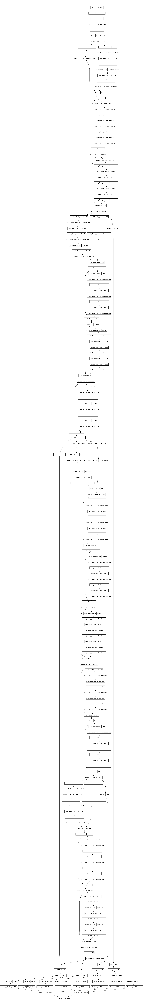

In [32]:
plot_model(model)

In [33]:
def gen(dataset):
    dataset = str(dataset, encoding='utf-8')
    if dataset == "train":
        set_ = train_target
    elif dataset == "val":
        set_ = val_target
        
    for index, row in set_.iterrows():
        image_data = cv2.imread("/kaggle/input/coco-2017-dataset/coco2017/"+dataset+"2017/"+row.file_name)/255
        image_data, bboxs = preprocess_data(image_data, row.bbox.copy())
        yield tf.convert_to_tensor(image_data, dtype=tf.float32), tf.convert_to_tensor(bboxs, dtype=tf.float32), tf.convert_to_tensor(row.category_id, dtype=tf.int32)

train_dataset = tf.data.Dataset.from_generator(
     gen,
     output_signature=(
         tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
         tf.TensorSpec(shape=(None, 4), dtype=tf.float32),
         tf.TensorSpec(shape=(None,), dtype=tf.int32)),
    args=["train"]
)

val_dataset = tf.data.Dataset.from_generator(
     gen,
     output_signature=(
         tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
         tf.TensorSpec(shape=(None, 4), dtype=tf.float32),
         tf.TensorSpec(shape=(None,), dtype=tf.int32)),
    args=["val"]
)

autotune = tf.data.AUTOTUNE
batch_size = 4

train_dataset = train_dataset.shuffle(8 * batch_size)
train_dataset = train_dataset.padded_batch(batch_size=batch_size, padding_values=(0.0, 1e-8, -1), drop_remainder=True)

val_dataset = val_dataset.shuffle(8 * batch_size)
val_dataset = val_dataset.padded_batch(batch_size=batch_size, padding_values=(0.0, 1e-8, -1), drop_remainder=True)

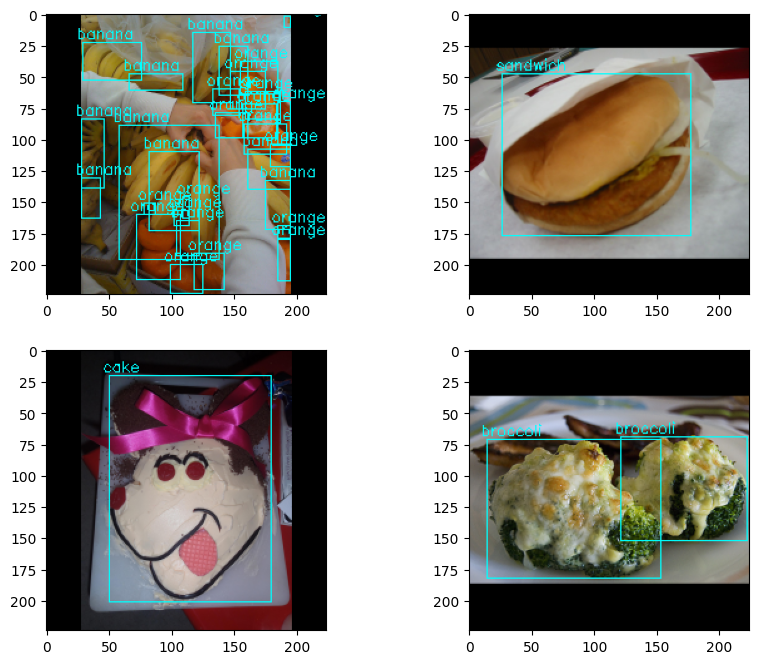

In [34]:
def get_category_name(id_):
    return train_cat.loc[train_cat.id == id_, "name"].values[0]

fig, axs = plt.subplots(2, 2, figsize=(10, 8))
for i, data in enumerate(train_dataset.take(1).unbatch()):
    plt.subplot(2, 2, i+1)
    img = tf.identity(data[0])
    for bbox, category_id in zip(data[1].numpy(), data[2].numpy()):
        if category_id != -1:
            img = add_bbox(img.numpy(), bbox, get_category_name(category_id), fontScale=0.4)
    plt.imshow(img[...,::-1]);